In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt

import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import skimage
import time

/data/jean.legoff/envs/conda_liif_env/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
dataset_path = '/data/jean.legoff/data/RESAC-SARGAS60/data'
npz_data_file = 'natl60_htuv_01102012_01102013.npz'

In [3]:
# simplified geographical limits
nav_lon = [-65, -40 ]
nav_lat = [ 26,  45]

In [4]:
data_set_filename = os.path.join(dataset_path,npz_data_file)

In [5]:
def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

In [6]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.
    
    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the 
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a 
    # hyperparameter.
    
    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of 
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 
                                             1 / self.in_features)      
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, 
                                             np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    def forward_with_intermediate(self, input): 
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate
    
    
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)
                
                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()
                    
                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else: 
                x = layer(x)
                
                if retain_grad:
                    x.retain_grad()
                    
            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

In [7]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

## Test fitting a point of SSH data

In [8]:
def resize_fn(img, size):
    return Resize(size, Image.BICUBIC)(img)

class ImageFitting(Dataset):
    def __init__(self, input_size, root_path):
        super().__init__()
        
        npz_data = np.load(root_path)
        n_var, n_time, n_lat, n_lon = np.shape(npz_data['FdataAllVar']) 
        npz_data = npz_data["FdataAllVar"][0,:,:,0:n_lat]
        
        img = ToTensor()(npz_data[0])
        img = resize_fn(img, input_size)
        
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(input_size, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):    
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels

In [9]:
ssh_img = ImageFitting(256, data_set_filename)
dataloader = DataLoader(ssh_img, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True)
img_siren.cuda()

/data/jean.legoff/envs/conda_liif_env/lib/python3.10/site-packages/torchvision/transforms/transforms.py:332: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  warnings.warn(
/data/jean.legoff/envs/conda_liif_env/lib/python3.10/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646755897462/work/aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): Linear(in_features=256, out_features=1, bias=True)
  )
)

Step 0, Total loss 0.216775, rmse 0.465591
Step 10, Total loss 0.018206, rmse 0.134928
Step 20, Total loss 0.005319, rmse 0.072930
Step 30, Total loss 0.001829, rmse 0.042763
Step 40, Total loss 0.000761, rmse 0.027583
Step 50, Total loss 0.000408, rmse 0.020196
Step 60, Total loss 0.000246, rmse 0.015674
Step 70, Total loss 0.000167, rmse 0.012914
Step 80, Total loss 0.000125, rmse 0.011202
Step 90, Total loss 0.000102, rmse 0.010075
Step 100, Total loss 0.000085, rmse 0.009239
Step 110, Total loss 0.000074, rmse 0.008578
Step 120, Total loss 0.000065, rmse 0.008036
Step 130, Total loss 0.000057, rmse 0.007579
Step 140, Total loss 0.000052, rmse 0.007185
Step 150, Total loss 0.000047, rmse 0.006842
Step 160, Total loss 0.000043, rmse 0.006539
Step 170, Total loss 0.000039, rmse 0.006270
Step 180, Total loss 0.000036, rmse 0.006029
Step 190, Total loss 0.000034, rmse 0.005811
Step 200, Total loss 0.000032, rmse 0.005614


/tmp/ipykernel_526237/3097468989.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1,3, figsize=(18,6))


Step 210, Total loss 0.000030, rmse 0.005435
Step 220, Total loss 0.000028, rmse 0.005272
Step 230, Total loss 0.000026, rmse 0.005122
Step 240, Total loss 0.000025, rmse 0.004985
Step 250, Total loss 0.000024, rmse 0.004858
Step 260, Total loss 0.000022, rmse 0.004741
Step 270, Total loss 0.000022, rmse 0.004669
Step 280, Total loss 0.000948, rmse 0.030782
Step 290, Total loss 0.000217, rmse 0.014745
Step 300, Total loss 0.000078, rmse 0.008853
Step 310, Total loss 0.000024, rmse 0.004888
Step 320, Total loss 0.000028, rmse 0.005270
Step 330, Total loss 0.000020, rmse 0.004440
Step 340, Total loss 0.000019, rmse 0.004382
Step 350, Total loss 0.000018, rmse 0.004218
Step 360, Total loss 0.000017, rmse 0.004103
Step 370, Total loss 0.000016, rmse 0.004023
Step 380, Total loss 0.000016, rmse 0.003950
Step 390, Total loss 0.000015, rmse 0.003883
Step 400, Total loss 0.000015, rmse 0.003820
Step 410, Total loss 0.000014, rmse 0.003762
Step 420, Total loss 0.000014, rmse 0.003707
Step 430, 

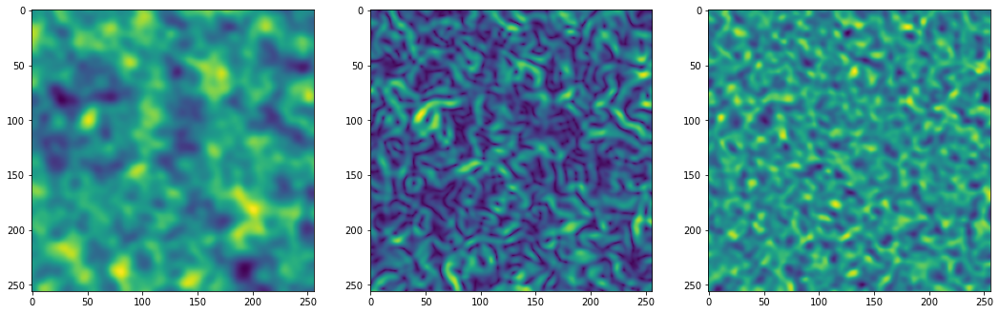

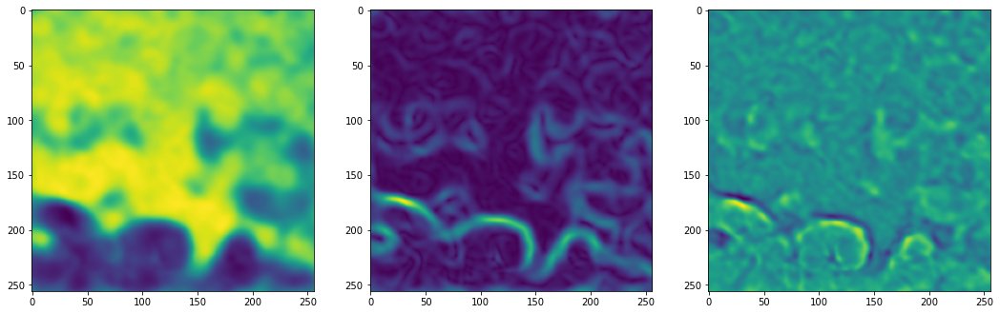

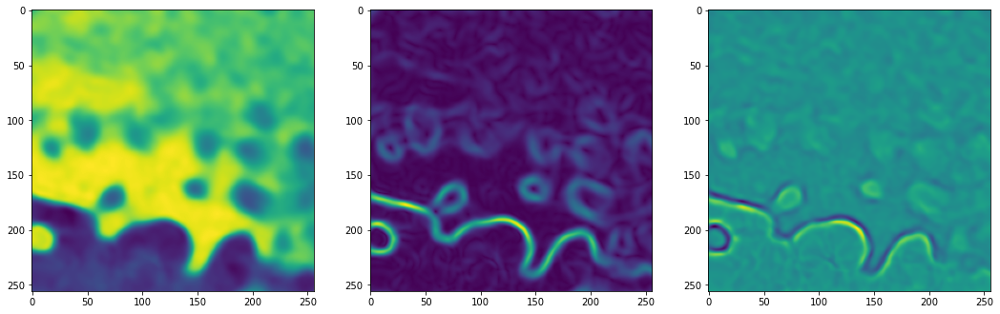

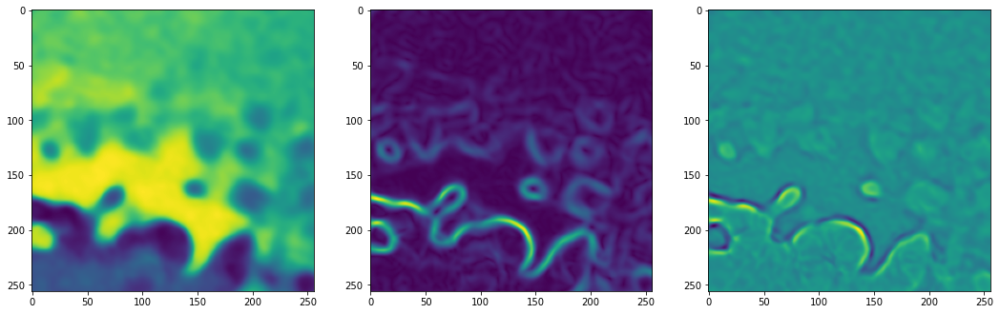

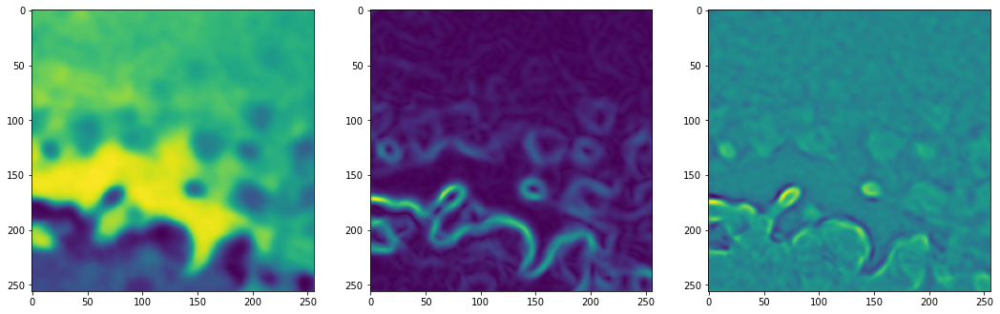

...

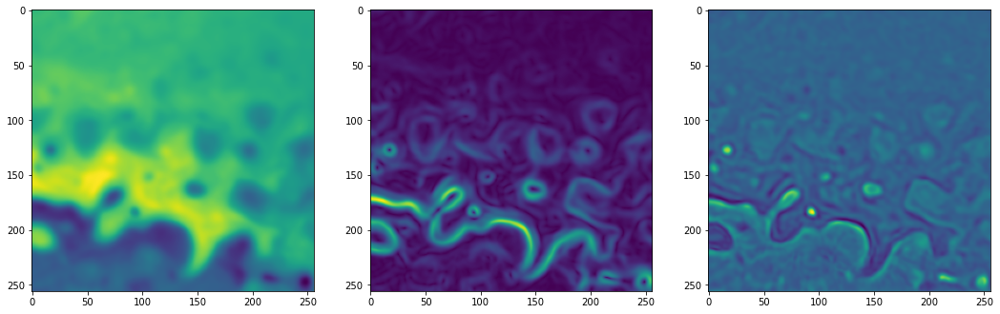

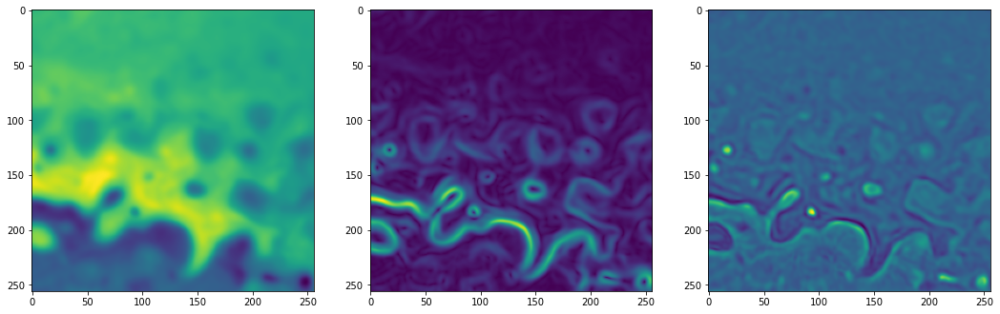

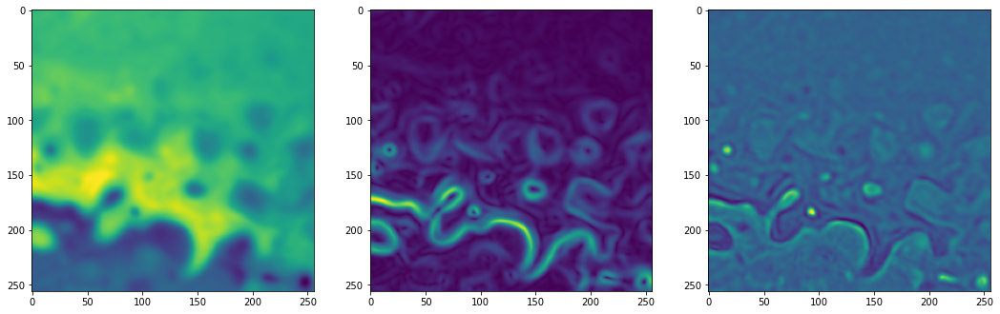

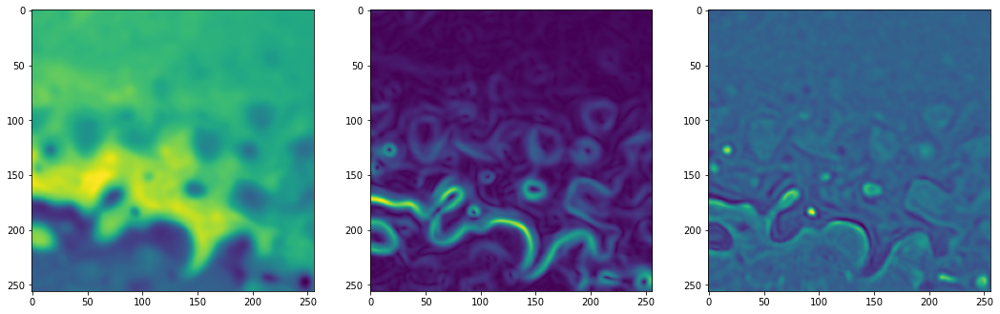

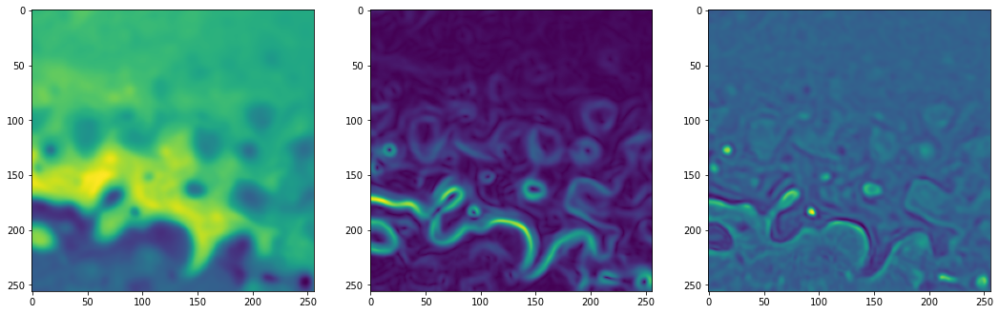

In [12]:
total_steps = 500 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 10

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_siren(model_input)    
    loss = ((model_output - ground_truth)**2).mean()
    rmse = loss.sqrt()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f, rmse %0.6f" % (step, loss, rmse))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy())
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy())
        plt.savefig(f"results_step{step}.png")
    plt.close('all')

    optim.zero_grad()
    loss.backward()
    optim.step()

## Super-Resolution test

In [11]:
ssh_img = ImageFitting(256, data_set_filename)
dataloader = DataLoader(ssh_img, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True)
img_siren.cuda()

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

model_output, coords = img_siren(model_input)    
loss = ((model_output - ground_truth)**2).mean()
rmse = loss.sqrt()

print("Step %d, Total loss %0.6f, rmse %0.6f" % (step, loss, rmse))

img_grad = gradient(model_output, coords)
img_laplacian = laplace(model_output, coords)

fig, axes = plt.subplots(1,3, figsize=(18,6))
axes[0].imshow(model_output.cpu().view(432,432).detach().numpy())
axes[1].imshow(img_grad.norm(dim=-1).cpu().view(432,432).detach().numpy())
axes[2].imshow(img_laplacian.cpu().view(432,432).detach().numpy())
plt.show()

Step 499, Total loss 0.216775, rmse 0.465591


RuntimeError: element 0 of tensors does not require grad and does not have a grad_fn